In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import h5py
import sys
import os
import glob
import warnings
import pysindy as ps
import matplotlib.pyplot as plt

from tqdm import tqdm

basedir = '/project/vitelli/jonathan/REDO_fruitfly/'
sys.path.insert(0, os.path.join(basedir, 'src'))

from utils.translation_utils import *


warnings.filterwarnings('ignore')

In [2]:
transform = Reshape2DField()

cad_dataset = AtlasDataset('WT', 'ECad-GFP', 'tensor2D', transform=transform)
vel_dataset = AtlasDataset('WT', 'ECad-GFP', 'velocity2D', transform=transform)
sqh_dataset = AtlasDataset('WT', 'sqh-mCherry', 'tensor2D', transform=transform)
svel_dataset = AtlasDataset('WT', 'sqh-mCherry', 'velocity2D', transform=transform)
runt_dataset = AtlasDataset('WT', 'Runt', 'raw2D', transform=transform)
#sqh_dataset.df = sqh_dataset.df[sqh_dataset.df.embryoID.isin(cad_dataset.df.embryoID.unique())].reset_index(drop=True)
sqh_info = get_decomposition_results(sqh_dataset, overwrite=False, crop=10)
#svel_info = get_decomposition_results(svel_dataset, overwrite=True, crop=10)
cad_info = get_decomposition_results(cad_dataset, overwrite=False, crop=10)
vel_info = get_decomposition_results(vel_dataset, overwrite=False, crop=10)
runt_info = get_decomposition_results(runt_dataset, overwrite=False, crop=10)

100%|██████████| 6/6 [00:00<00:00, 579.26it/s]


Found SVDPipeline for this dataset!
Found SVDPipeline for this dataset!
Found SVDPipeline for this dataset!
Found SVDPipeline for this dataset!


# Figure 1 - Tissue Velocity is Sparse

100%|██████████| 6/6 [00:00<00:00, 609.55it/s]

202001150004


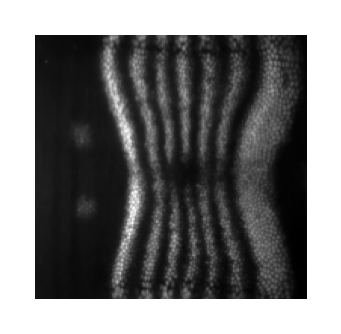

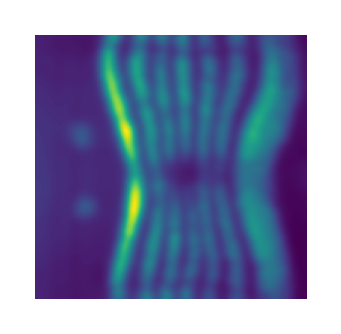

In [3]:
#Demonstrate ensemble of cell trajectories
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.linewidth'] = 0.
plt.rcParams['axes.titlesize'] = 8

fig1 = plt.figure(figsize=(1, 1), dpi=350)
ax1 = fig1.gca()

fig2 = plt.figure(figsize=(1, 1), dpi=350)
ax2 = fig2.gca()


from scipy.ndimage import gaussian_filter

d1 = AtlasDataset('WT', 'Runt', 'raw2D', transform=transform)
d2 = AtlasDataset('WT', 'Runt', 'raw2D', transform=transform)
key = 'runt'

df = d1.df
df.time = df.time.astype(int)
rows = df[(df.time == 25)]# & (df.embryoID == 202001261800) ]

raw = None
ic = None

row = rows.iloc[0]
print(row.embryoID)
ic = gaussian_filter(d1.values[row.embryoID][row.eIdx, ..., 10:-10, 10:-10], sigma=3)
raw = d2.values[row.embryoID][row.eIdx, ..., 10:-10, 10:-10]

color_2D(ax1, raw-np.min(raw), cmap='Greys_r')
color_2D(ax2, ic, cmap='viridis')
ax1.set_aspect('auto')
ax2.set_aspect('auto')
fig1.savefig('Figures/%s_Raw.png' % key, dpi=350, bbox_inches='tight')
fig2.savefig('Figures/%s_IC.png' % key, dpi=350, bbox_inches='tight')

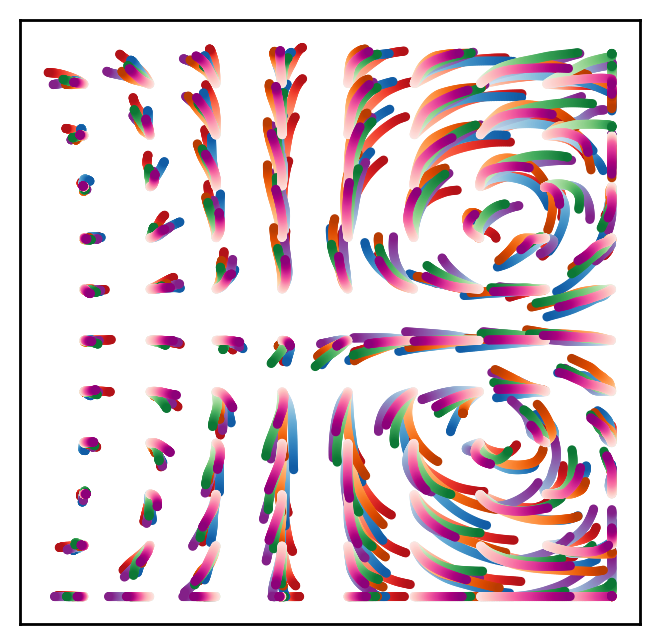

In [4]:
#Demonstrate ensemble of cell trajectories
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.linewidth'] = 1.
plt.rcParams['axes.titlesize'] = 8


from math import floor, ceil
from scipy.interpolate import RectBivariateSpline as interp2d

def get_velocity(v, tt, X0, Y0, x, y):
    idxA, idxB = floor(tt), ceil(tt)
    frac = 1 - (tt - idxA)
    vA, vB = v[idxA], v[idxB]
        
    vx = interp2d(Y0, X0, frac * vA[1] + (1 - frac) * vB[1])(y, x, grid=False)
    vy = interp2d(Y0, X0, frac * vA[0] + (1 - frac) * vB[0])(y, x, grid=False)
    return vx, vy

def rk4DynamicVelocity2D(pts, X0v, Y0v, v, hh):
    tt = np.arange(0, v.shape[0]-1, hh)
    xyPathsMat = np.zeros([pts.shape[0], len(tt), 2])

    x = pts[:, 0]
    y = pts[:, 1]
    xyPathsMat[:, 0, 0] = x
    xyPathsMat[:, 0, 1] = y
    
    Xmin, Xmax = X0v[0], X0v[-1]
    Ymin, Ymax = Y0v[0], Y0v[-1]
    
    for ii in range(len(tt) - 1):
        k1x, k1y = get_velocity(v, tt[ii], X0v, Y0v, x, y)
        k2x, k2y = get_velocity(v, tt[ii] + 0.5 * hh, X0v, Y0v, x + 0.5 * hh * k1x, y + 0.5 * hh * k1y)
        k3x, k3y = get_velocity(v, tt[ii] + 0.5 * hh, X0v, Y0v, x + 0.5 * hh * k2x, y + 0.5 * hh * k2y)
        k4x, k4y = get_velocity(v, tt[ii] + hh, X0v, Y0v, x + hh * k3x, y + hh * k3y)
        
        #Main equation
        x = x + (k1x + 2 * k2x + 2 * k3x + k4x) * hh / 6.
        y = y + (k1y + 2 * k2y + 2 * k3y + k4y) * hh / 6.
        
        x[x > Xmax] = Xmax
        x[x < Xmin] = Xmin
        y[y > Ymax] = Ymax
        y[y < Ymin] = Ymin
        
        xyPathsMat[:, ii, 0] = x
        xyPathsMat[:, ii, 1] = y
            
    return xyPathsMat

from scipy.io import loadmat
px = loadmat('/project/vitelli/jonathan/fruitfly/flydrive.synology.me/minimalData/vitelli_sharing/pixel_coordinates.mat')
X0, Y0 = px['XX'], px['YY']

X0 = X0 * 0.2619 / 0.4 #Convert pixels to microns
Y0 = Y0 * 0.2619 / 0.4 #Convert pixels to microns

X0 = X0[10:-10, 10:-10]
Y0 = Y0[10:-10, 10:-10]

df = vel_dataset.df
df.time = df.time.astype(int)
rows = df[df.time == 30]
tmax = 15

hh = 0.2
sub = 20
pts = np.stack([X0[::-sub, ::-sub].flatten(), 
                Y0[::sub, ::sub].flatten()], axis=-1).reshape([-1, 2])

fig, ax = plt.subplots(1, 1, dpi=200, figsize=(4, 4))

cmaps = [
    'Reds',
    'Blues',
    'BuPu',
    'Oranges',
    'Greens',
    'RdPu',
]

for i in range(len(rows)):
    row = rows.iloc[i]
    v = vel_dataset.values[row.embryoID][row.eIdx:row.eIdx+tmax, :, 10:-10, 10:-10]
    xyPathsMat = rk4DynamicVelocity2D(pts, X0[0], Y0[:, 0], v, hh)

    nPts = xyPathsMat.shape[0]
    nTps = xyPathsMat.shape[1]
    for tpId in range(nTps-1):
        ax.scatter(xyPathsMat[:, tpId, 0], xyPathsMat[:, tpId, 1], s=5, 
                   c=np.ones(nPts)*tpId, 
                   cmap=cmaps[i], vmin=-10, vmax=nTps*1.2)
        
ax.set(xticks=[], yticks=[])
plt.savefig('Figures/EnsembleTrajectories.png', dpi=350, bbox_inches='tight')

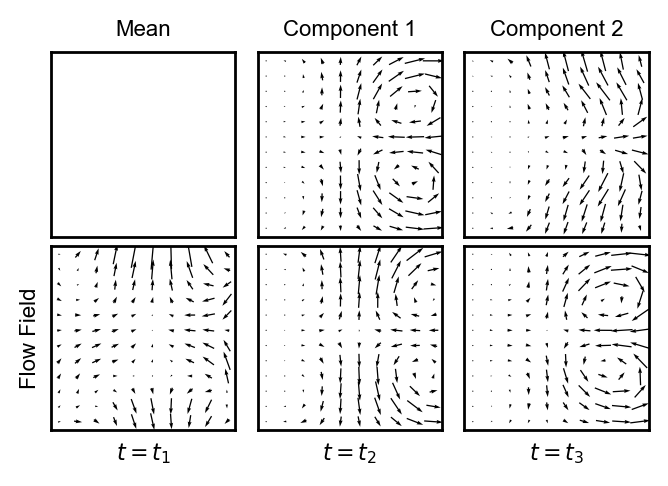

In [83]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.linewidth'] = 1.
plt.rcParams['axes.titlesize'] = 8

model, df = vel_info
tmin, tmax = 15, 60
df = vel_info[1].copy()
df = df[(df.t >= tmin) & (df.t <= tmax)]
offset = 10

fig, ax = plt.subplots(2, 3, figsize=(4, 2.5))

from scipy.interpolate import interp1d
df['t'] = np.round(df['t'])
data = df.groupby('t').agg(np.mean).reset_index()
t = np.linspace(tmin, tmax, 100)
p0 = interp1d(data.t, data.param0)
p1 = interp1d(data.t, data.param1)
t = [20, 31, 50]

vmin = df.mag.min()
vmax = 2*df.mag.max()
kwargs = dict(skip=18, width=0.007)


z = model.components_.reshape([-1, *model.data_shape_]) * np.sqrt(model.explained_variance_[:, None, None, None])
plot_vector2D(ax[0, 0], model.mean_.reshape(model.data_shape_), **kwargs)
plot_vector2D(ax[0, 1], z[0], **kwargs)
plot_vector2D(ax[0, 2], z[1], **kwargs)

for i in range(len(t)):

    row = (data.t - t[i]).abs().argmin()
    row = data.iloc[row].filter(like='param').values
    z = model.inverse_transform(row[None])[0]
    plot_vector2D(ax[1, i], z, **kwargs)


for a in ax.flatten():
    a.set_aspect(np.ptp(a.get_xlim()) / np.ptp(a.get_ylim()))
        
ax[0, 0].set_title('Mean')
ax[0, 1].set_title('Component 1')
ax[0, 2].set_title('Component 2')

    
for i in range(3):
    ax[1, i].set_xlabel('$t = t_%d$' % (i+1))
                            
ax[-1, 0].set_ylabel('Flow Field')  

fig.subplots_adjust(wspace=0.0, hspace=0.05)

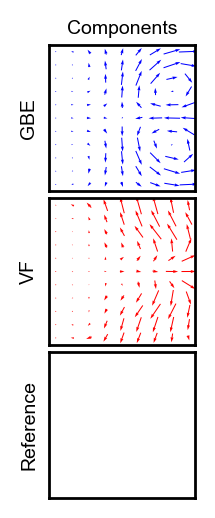

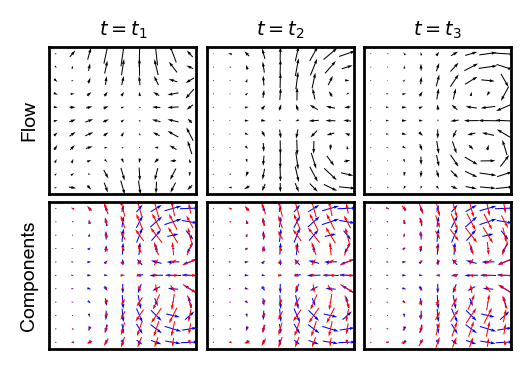

In [5]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

plt.rcParams['font.size'] = 7
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.linewidth'] = 1.
plt.rcParams['axes.titlesize'] = 7

model, df = vel_info
tmin, tmax = 15, 60
df = vel_info[1].copy()
df = df[(df.t >= tmin) & (df.t <= tmax)]
offset = 10

from scipy.interpolate import interp1d
df['t'] = np.round(df['t'])
data = df.groupby('t').agg(np.mean).reset_index()
t = np.linspace(tmin, tmax, 100)
p0 = interp1d(data.t, data.param0)
p1 = interp1d(data.t, data.param1)
t = [20, 31, 50]

fig1, ax1 = plt.subplots(3, 1, figsize=(1, 3))
fig2, ax2 = plt.subplots(2, 3, figsize=(3, 2))


vmin = df.mag.min()
vmax = 2*df.mag.max()
kwargs = dict(skip=20, width=0.007)


z = model.components_.reshape([-1, *model.data_shape_]) * np.sqrt(model.explained_variance_[:, None, None, None])
plot_vector2D(ax1[0], z[0], color='blue', **kwargs)
plot_vector2D(ax1[1], z[1], color='red', **kwargs)
plot_vector2D(ax1[2], model.mean_.reshape(model.data_shape_), **kwargs)


for i in range(len(t)):
    row = (data.t - t[i]).abs().argmin()
    row = data.iloc[row].filter(like='param').values
    z = model.inverse_transform(row[None])[0]
    plot_vector2D(ax2[0, i], z, **kwargs)
    
    z = np.zeros([2, model.n_components])
    z[0, 0] = row[0]
    z[1, 1] = row[1]
    z = model.inverse_transform(z)
    plot_vector2D(ax2[1, i], z[0], color='blue', **kwargs)
    plot_vector2D(ax2[1, i], z[1], color='red', **kwargs)


for a in ax1.flatten():
    a.set_aspect(np.ptp(a.get_xlim()) / np.ptp(a.get_ylim()))
for a in ax2.flatten():
    a.set_aspect(np.ptp(a.get_xlim()) / np.ptp(a.get_ylim()))
    
ax1[0].set_xlabel('Components')
ax1[0].set_ylabel('GBE')
ax1[1].set_ylabel('VF')
ax1[2].set_ylabel('Reference')


ax2[0, 0].set_ylabel('Flow')
ax2[1, 0].set_ylabel('Components')


    
for i in range(3):
    ax1[i].xaxis.set_label_position('top')
    ax1[i].yaxis.set_label_position('left')
    ax2[0, i].set_xlabel('$t = t_%d$' % (i+1))
    ax2[0, i].xaxis.set_label_position('top')
                            
fig1.subplots_adjust(wspace=0.05, hspace=0.05)
fig2.subplots_adjust(wspace=0.05, hspace=0.05)

fig1.savefig('Figures/velocity_components.png', dpi=350, bbox_inches='tight')
fig1.savefig('Figures/velocity_components.svg', bbox_inches='tight')

fig2.savefig('Figures/velocity_time.png', dpi=350, bbox_inches='tight')
fig2.savefig('Figures/velocity_time.svg', bbox_inches='tight')

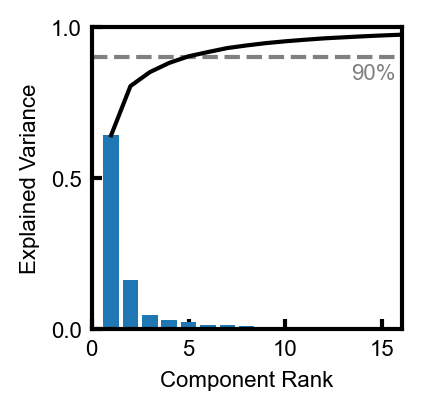

In [6]:
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5

fig, ax = plt.subplots(1, 1, figsize=(2, 2))

model, df = vel_info

cpt = np.arange(model.n_components) + 1
ax.plot(cpt, np.cumsum(model.explained_variance_ratio_), color='black')
ax.bar(cpt, model.explained_variance_ratio_, zorder=2)
ax.set(xlim=[np.min(cpt)-0.5, np.max(cpt)], xticks=[0, 5, 10, 15],
       xlabel='Component Rank',
       ylim=[0, 1], yticks=[0, 0.5, 1],
       ylabel='Explained Variance')
ax.axhline(0.9, color='grey', linestyle='--', zorder=0)
ax.text(0.98, 0.88, '90%', transform=ax.transAxes,
        color='grey', va='top', ha='right')

fig.savefig('Figures/velocity_sparsity.svg', bbox_inches='tight')

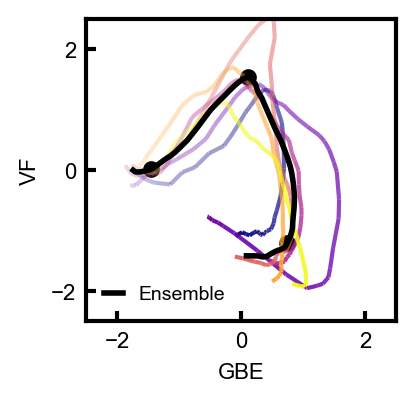

In [8]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7

model, df = vel_info
tmin, tmax = 15, 60
df = vel_info[1].copy()
df = df[(df.t >= tmin) & (df.t <= tmax)]
offset = 10

fig, ax = plt.subplots(1, 1, figsize=(2, 2))

colors = plt.cm.plasma(np.linspace(0, 1, len(df.embryoID.unique())))
for i, embryoID in enumerate(df.embryoID.unique()):
    data = df[df.embryoID == embryoID].sort_values('t')
    
    c = np.repeat(colors[i][None], len(data), axis=0)
    array = (data.t.values +offset- np.min(data.t)) / (np.ptp(data.t)+offset)
    c[:, -1] = array
    p0 = data.param0.values - np.mean(df.param0)
    p1 = data.param1.values - np.mean(df.param1)
    points = np.vstack((p0, p1)).T.reshape([-1, 1, 2])
    segs = np.hstack((points[:-1], points[1:]))
    lc = LineCollection(segs, colors=c)
    ax.add_collection(lc)

from scipy.interpolate import interp1d
df['t'] = np.round(df['t'])
data = df.groupby('t').agg(np.mean).reset_index()
t = np.linspace(tmin, tmax, 100)
p0 = interp1d(data.t, data.param0 - data.param0.mean(), fill_value='extrapolate')
p1 = interp1d(data.t, data.param1 - data.param1.mean(), fill_value='extrapolate')
ax.plot(p0(t), p1(t),
        color='black', lw=2, label='Ensemble')
t = [20, 31, 50]
ax.scatter(p0(t), p1(t), s=25, color='black')

ax.set(xlim=[-2.5, 2.5], xticks=[-2, 0, 2],
       ylim=[-2.5, 2.5], yticks=[-2, 0, 2],
       xlabel='GBE',
       ylabel='VF')
ax.legend(loc='lower left')

fig.savefig('Figures/velocity_trajectory.svg', bbox_inches='tight')
fig.savefig('Figures/velocity_trajectory.png', dpi=350, bbox_inches='tight')

# Figure 2 - A search for sparsity

## Summary

ValueError: cannot convert float NaN to integer

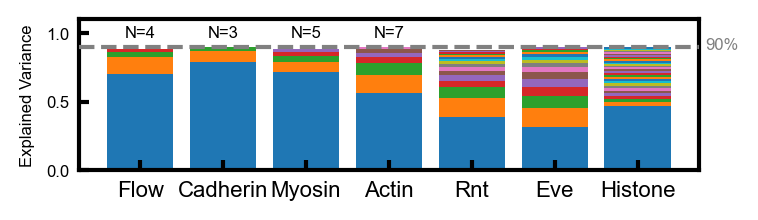

In [326]:
import pickle as pk
from sklearn.decomposition import PCA

plt.rcParams['font.size'] = 6
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['axes.edgecolor'] = 'black'


basedir = '../MLData/WT'

models = {
    'Flow': 'ECad-GFP/velocity_PCA.pkl',
    'Cadherin': 'ECad-GFP/tensor_PCA.pkl',
    'Myosin': 'sqh-mCherry/tensor_PCA.pkl',
    'Actin': 'moesin-GFP/tensor_PCA.pkl',
    'Rnt': 'Runt/raw_PCA.pkl',
    'Eve': 'Even_Skipped/raw_PCA.pkl',
    'Histone': 'histone-RFP/raw_PCA.pkl',
}
df = pd.DataFrame()
for i, key in enumerate(models.keys()):
    models[key] = pk.load(open(os.path.join(basedir, models[key]), 'rb'))
    evr = models[key].explained_variance_ratio_
    cum = np.cumsum(evr)
    dfi = pd.DataFrame({'explained_variance': evr, 'total_explained': cum})
    dfi['marker'] = key
    dfi['label'] = i
    df = df.append(dfi)
df = df.reset_index().rename({'index': 'component'}, axis=1)

fig = plt.figure(figsize=(4, 1))
ax = fig.gca()

colors = plt.cm.hsv(np.linspace(0, 1, df.component.max()))

for i in range(df.component.max()):
    dfi = df[(df.component == i) & (df.total_explained < 0.9)]
    if len(dfi) == 0: continue
    ax.bar(
        dfi.label,
        dfi.explained_variance, 
        bottom=dfi.total_explained-dfi.explained_variance)
ax.axhline(0.9, color='grey', linestyle='--', zorder=10)
ax.text(1.01, 0.88, '90%', transform=ax.transAxes,
        color='grey', va='top', ha='left')
ax.set(yticks = [0, 0.5, 1], ylim=[0, 1.1], ylabel='Explained Variance')
ax.set_ylabel('Explained Variance')
ax.set(
    xticks = df.label.unique(),
    xticklabels = df.marker.unique(),
)
for i in range(df.label.max()+1):
    dfi = df[(df.label == i)]
    dfi = dfi[dfi.total_explained >= 0.9]
    N = dfi.component.min()
    ax.text(i, 0.95, 'N=%d'% N, 
            va='bottom', ha='center')
plt.savefig('Figures/sparsity_summary.svg', bbox_inches='tight')

## Cadherin

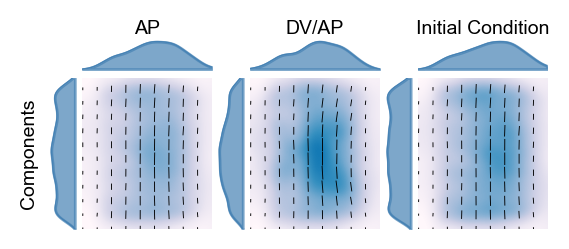

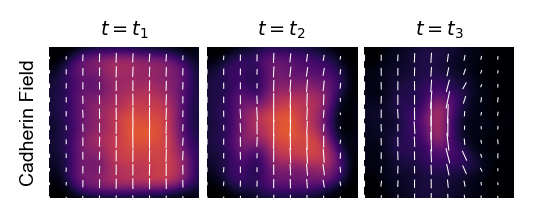

In [9]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.rcParams['font.size'] = 7
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 0.0
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.edgecolor'] = 'black'


model, df = cad_info

from scipy.interpolate import interp1d
df['t'] = np.round(df['t'])
data = df.groupby('t').agg(np.mean).reset_index()
t = np.linspace(tmin, tmax, 100)
p0 = interp1d(data.t, data.param0)
p1 = interp1d(data.t, data.param1)
t = [20, 31, 50]


N = 3
fig1, ax1 = plt.subplots(1, N, figsize=(N, 1))
fig2, ax2 = plt.subplots(1, N, figsize=(N, 1))

vmin = df.mag.min()
vmax = 1.5*df.mag.max()
kwargs = dict(skip=20, vmin=vmin, vmax=vmax)

z = np.zeros([N, model.n_components])
z[0, 0] = 0.5
z[1, 1] = 1

cmap='PuBu'
color='steelblue'
crop = 50
z = model.inverse_transform(z)
for i in range(3):
    plot_tensor2D(ax1[i], z[i], cmap=cmap, linecolor='black', **kwargs)
    ax_X = ax1[i].inset_axes([0, 1.05, 1, 0.2], sharex=ax1[i])
    cut_X = np.mean(np.linalg.norm(z[i], axis=0)[crop:-crop, :], axis=0)
    x = np.linspace(*ax1[i].get_xlim(), len(cut_X))
    ax_X.plot(x, cut_X, color=color, lw=0.5)
    ax_X.fill_between(x, np.ones_like(cut_X) * np.min(cut_X), cut_X, color=color, alpha=0.7)
    ax_X.set(xticks=[], yticks=[])
    
    ax_Y = ax1[i].inset_axes([-0.25, 0, 0.2, 1], sharey=ax1[i])
    cut_Y = np.mean(np.linalg.norm(z[i], axis=0)[:, crop:-crop], axis=1)
    y = np.linspace(*ax1[i].get_ylim(), len(cut_Y))
    ax_Y.plot(cut_Y, y, color=color, lw=0.5)
    ax_Y.fill_betweenx(y, np.ones_like(cut_Y)*np.min(cut_Y), cut_Y, color=color, alpha=0.7)
    ax_Y.set(xticks=[], yticks=[])
    ax_Y.invert_xaxis()
    
    ax1[i].set_aspect('auto')

    
    row = (data.t - t[i]).abs().argmin()
    row = data.iloc[row].filter(like='param').values
    r = model.inverse_transform(row[None])
    plot_tensor2D(ax2[i], r, **kwargs)
    ax2[i].set_aspect('auto')
        
    ax1[i].xaxis.set_label_position('top')
    ax2[i].xaxis.set_label_position('top')

    ax2[i].set_xlabel('$t = t_%d$' % (i+1)) 
    
lp=16
ax1[0].set_xlabel('AP', labelpad=lp)
ax1[1].set_xlabel('DV/AP', labelpad=lp)
ax1[2].set_xlabel('Initial Condition', labelpad=lp)
ax1[0].set_ylabel('Components', labelpad=lp)

ax2[0].set_ylabel('Cadherin Field')  

fig1.subplots_adjust(wspace=0.3, hspace=0.05)
fig2.subplots_adjust(wspace=0.05, hspace=0.05)

fig1.savefig('Figures/cadherin_components.png', dpi=350, bbox_inches='tight')
fig2.savefig('Figures/cadherin_time.png', dpi=350, bbox_inches='tight')

fig1.savefig('Figures/cadherin_components.svg', bbox_inches='tight')
fig2.savefig('Figures/cadherin_time.svg', bbox_inches='tight')

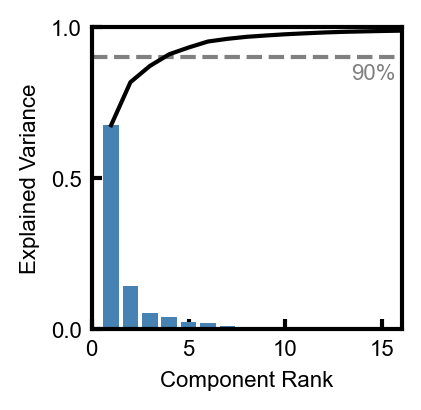

In [10]:
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['xtick.labelsize'] = 8

model, df = cad_info

fig, ax = plt.subplots(1, 1, figsize=(2, 2))

cpt = np.arange(model.n_components_) + 1
ax.plot(cpt, np.cumsum(model.explained_variance_ratio_), color='black')
ax.bar(cpt, model.explained_variance_ratio_, color=color, zorder=2)
ax.set(xlim=[np.min(cpt)-0.5, np.max(cpt)], xticks=[0, 5, 10, 15],
       xlabel='Component Rank',
       ylim=[0, 1], yticks=[0, 0.5, 1],
       ylabel='Explained Variance')
ax.axhline(0.9, color='grey', linestyle='--', zorder=0)
ax.text(0.98, 0.88, '90%', transform=ax.transAxes,
        color='grey', va='top', ha='right')

plt.savefig('Figures/cadherin_sparsity.png', dpi=350, bbox_inches='tight')
plt.savefig('Figures/cadherin_sparsity.svg', bbox_inches='tight')

Bad:  [202001282000]


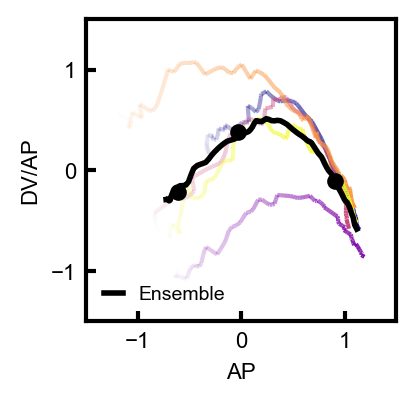

In [11]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['axes.edgecolor'] = 'black'
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7

model, df = cad_info
tmin, tmax = 15, 60
df = cad_info[1].copy()
df = df[(df.t >= tmin) & (df.t <= tmax)]

fig, ax = plt.subplots(1, 1, figsize=(2, 2))

from scipy.interpolate import interp1d
from scipy.signal import convolve

bad = []
for embryoID in df.embryoID.unique():
    if df[df.embryoID == embryoID].param1.max() > 2:
        bad.append(embryoID)
print('Bad: ', bad)
df = df[~df.embryoID.isin(bad)]
df.param0 -= (np.max(df.param0) + np.min(df.param0)) / 2
df.param1 -= (np.max(df.param1) + np.min(df.param1)) / 2

colors = plt.cm.plasma(np.linspace(0, 1, len(df.embryoID.unique())))

for i, embryoID in enumerate(df.embryoID.unique()):
    data = df[df.embryoID == embryoID].sort_values('t')
    
    t0 = (data.t.values - np.min(data.t)) / np.ptp(data.t)
    t = np.linspace(0, 1, 100)
    
    p0 = interp1d(t0, data.param0.values)(t)
    p1 = interp1d(t0, data.param1.values)(t)

    points = np.vstack((p0, p1)).T.reshape([-1, 1, 2])
    segs = np.hstack((points[:-1], points[1:]))
                          
    c = np.repeat(colors[i][None], len(segs), axis=0)
    c[:, -1] = t[1:]

    lc = LineCollection(segs, colors=c)
    ax.add_collection(lc)

df['t'] = np.round(df['t'])
data = df.groupby('t').agg(np.mean).reset_index()
t = np.linspace(tmin, tmax, 100)
p0 = interp1d(data.t, data.param0, fill_value='extrapolate')
p1 = interp1d(data.t, data.param1, fill_value='extrapolate')
ax.plot(p0(t), p1(t),
        color='black', lw=2, label='Ensemble')
t = [20, 31, 50]
ax.scatter(p0(t), p1(t), s=25, color='black', zorder=10)

ax.set(xlim=[-1.5, 1.5], xticks=[-1, 0, 1],
       ylim=[-1.5, 1.5], yticks=[-1, 0, 1],
       xlabel='AP',
       ylabel='DV/AP')
ax.legend(loc='lower left')

plt.savefig('Figures/cadherin_trajectory.png', dpi=350, bbox_inches='tight')
plt.savefig('Figures/cadherin_trajectory.svg', bbox_inches='tight')

## Myosin

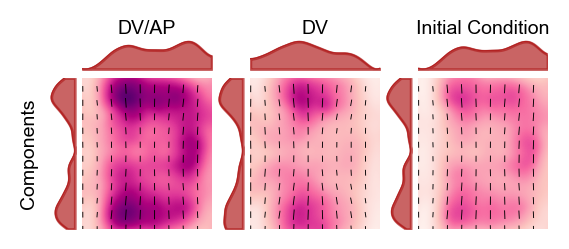

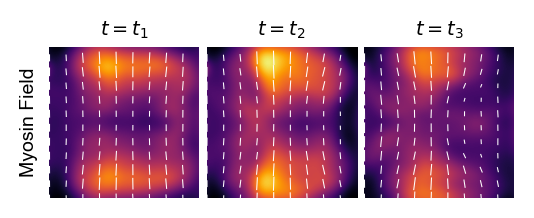

In [12]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.rcParams['font.size'] = 7
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 0.0
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.edgecolor'] = 'black'


model, df = sqh_info

from scipy.interpolate import interp1d
df['t'] = np.round(df['t'])
data = df.groupby('t').agg(np.mean).reset_index()
t = np.linspace(tmin, tmax, 100)
p0 = interp1d(data.t, data.param0)
p1 = interp1d(data.t, data.param1)
t = [20, 31, 50]


N = 3
fig1, ax1 = plt.subplots(1, N, figsize=(N, 1))
fig2, ax2 = plt.subplots(1, N, figsize=(N, 1))


vmin = 4*df.mag.min()
vmax = 0.75*df.mag.max()
kwargs = dict(skip=20, vmin=vmin, vmax=vmax)

z = np.zeros([N, model.n_components])
z[0, 0] = 0.5
z[1, 1] = 1

cmap='RdPu'
color='firebrick'
crop = 50
z = model.inverse_transform(z)
for i in range(3):
    plot_tensor2D(ax1[i], z[i], cmap=cmap, linecolor='black', **kwargs)
    ax_X = ax1[i].inset_axes([0, 1.05, 1, 0.2], sharex=ax1[i])
    cut_X = np.mean(np.linalg.norm(z[i], axis=0)[crop:-crop, :], axis=0)
    x = np.linspace(*ax1[i].get_xlim(), len(cut_X))
    ax_X.plot(x, cut_X, color=color, lw=0.5)
    ax_X.fill_between(x, np.ones_like(cut_X) * np.min(cut_X), cut_X, color=color, alpha=0.7)
    ax_X.set(xticks=[], yticks=[])
    
    ax_Y = ax1[i].inset_axes([-0.25, 0, 0.2, 1], sharey=ax1[i])
    cut_Y = np.mean(np.linalg.norm(z[i], axis=0)[:, crop:-crop], axis=1)
    y = np.linspace(*ax1[i].get_ylim(), len(cut_Y))
    ax_Y.plot(cut_Y, y, color=color, lw=0.5)
    ax_Y.fill_betweenx(y, np.ones_like(cut_Y)*np.min(cut_Y), cut_Y, color=color, alpha=0.7)
    ax_Y.set(xticks=[], yticks=[])
    ax_Y.invert_xaxis()
    
    ax1[i].set_aspect('auto')

    
    row = (data.t - t[i]).abs().argmin()
    row = data.iloc[row].filter(like='param').values
    r = model.inverse_transform(row[None])
    plot_tensor2D(ax2[i], r, **kwargs)
    ax2[i].set_aspect('auto')
        
    ax1[i].xaxis.set_label_position('top')
    ax2[i].xaxis.set_label_position('top')

    ax2[i].set_xlabel('$t = t_%d$' % (i+1)) 
    
lp=16
ax1[0].set_xlabel('DV/AP', labelpad=lp)
ax1[1].set_xlabel('DV', labelpad=lp)
ax1[2].set_xlabel('Initial Condition', labelpad=lp)
ax1[0].set_ylabel('Components', labelpad=lp)

ax2[0].set_ylabel('Myosin Field')  

fig1.subplots_adjust(wspace=0.3, hspace=0.05)
fig2.subplots_adjust(wspace=0.05, hspace=0.05)

fig1.savefig('Figures/myosin_components.png', dpi=350, bbox_inches='tight')
fig2.savefig('Figures/myosin_time.png', dpi=350, bbox_inches='tight')


fig1.savefig('Figures/myosin_components.svg', bbox_inches='tight')
fig2.savefig('Figures/myosin_time.svg', bbox_inches='tight')

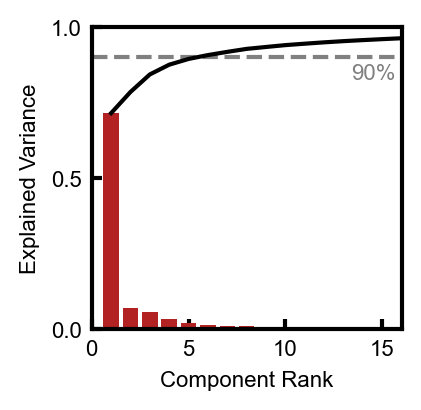

In [13]:
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5

model, df = sqh_info

fig, ax = plt.subplots(1, 1, figsize=(2, 2))

cpt = np.arange(model.n_components_) + 1
ax.plot(cpt, np.cumsum(model.explained_variance_ratio_), color='black')
ax.bar(cpt, model.explained_variance_ratio_, zorder=2, color=color)
ax.set(xlim=[np.min(cpt)-0.5, np.max(cpt)], xticks=[0, 5, 10, 15],
       xlabel='Component Rank',
       ylim=[0, 1], yticks=[0, 0.5, 1],
       ylabel='Explained Variance')
ax.axhline(0.9, color='grey', linestyle='--', zorder=0)
ax.text(0.98, 0.88, '90%', transform=ax.transAxes,
        color='grey', va='top', ha='right')

plt.savefig('Figures/myosin_sparsity.png', dpi=350, bbox_inches='tight')
plt.savefig('Figures/myosin_sparsity.svg', bbox_inches='tight')

Bad:  [201912150847, 202001120940, 202001121650, 202001101100, 202001101100, 202001282000, 202001271700, 201912051330, 202001261520, 202001261520, 202001252040, 202001122020, 202001122020, 202001101316, 202002111410, 202002111410, 202002181400, 202002121315, 202001281800, 202002112350]


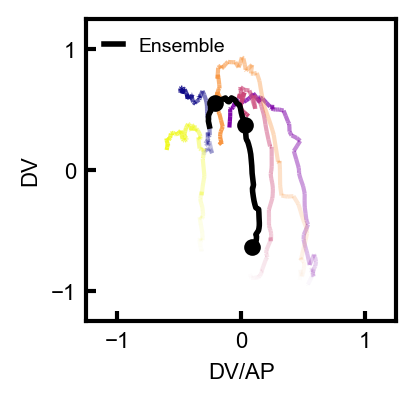

In [14]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.collections import LineCollection

plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
plt.rcParams['axes.edgecolor'] = 'black'

model, df = sqh_info
tmin, tmax = 15, 60
df = sqh_info[1].copy()
#df = df[df.embryoID.isin(cad_info[1].embryoID.unique())]
df = df[(df.t >= tmin) & (df.t <= tmax)]

fig, ax = plt.subplots(1, 1, figsize=(2, 2))

from scipy.interpolate import interp1d
from scipy.signal import convolve

bad = []
for embryoID in df.embryoID.unique():
    if np.max(np.abs(df[df.embryoID == embryoID].param1)) > 2:
        bad.append(embryoID)
    if np.max(np.abs(df[df.embryoID == embryoID].param0)) > .75:
        bad.append(embryoID)
print('Bad: ', bad)
df = df[~df.embryoID.isin(bad)]
df.param0 -= (np.max(df.param0) + np.min(df.param0)) / 2
df.param1 -= (np.max(df.param1) + np.min(df.param1)) / 2

colors = plt.cm.plasma(np.linspace(0, 1, len(df.embryoID.unique())))

for i, embryoID in enumerate(df.embryoID.unique()):
    data = df[df.embryoID == embryoID].sort_values('t')
    
    t0 = (data.t.values - np.min(data.t)) / np.ptp(data.t)
    t = np.linspace(0, 1, 100)
    
    p0 = interp1d(t0, data.param0.values)(t)
    p1 = interp1d(t0, data.param1.values)(t)

    points = np.vstack((p0, p1)).T.reshape([-1, 1, 2])
    segs = np.hstack((points[:-1], points[1:]))
                          
    c = np.repeat(colors[i][None], len(segs), axis=0)
    c[:, -1] = t[1:]

    lc = LineCollection(segs, colors=c)
    ax.add_collection(lc)

df['t'] = np.round(df['t'])
data = df.groupby('t').agg(np.mean).reset_index()
t = np.linspace(tmin, tmax, 100)
p0 = interp1d(data.t, data.param0, fill_value='extrapolate')
p1 = interp1d(data.t, data.param1, fill_value='extrapolate')
ax.plot(p0(t), p1(t),
        color='black', lw=2, label='Ensemble')
t = [15, 35, 50]
ax.scatter(p0(t), p1(t), s=25, color='black', zorder=10)

ax.set(xlim=[-1.25, 1.25], xticks=[-1, 0, 1],
       ylim=[-1.25, 1.25], yticks=[-1, 0, 1],
       xlabel='DV/AP',
       ylabel='DV')
ax.legend(loc='upper left')

plt.savefig('Figures/myosin_trajectory.png', dpi=350, bbox_inches='tight')
plt.savefig('Figures/myosin_trajectory.svg', bbox_inches='tight')

In [15]:
acc = pd.DataFrame()
acc = acc.append(pd.read_csv('PairRuleGenes.csv'))
acc = acc.append(pd.read_csv('Myosin+PairRuleGenes.csv'))
acc = acc.append(pd.read_csv('Myosin+Cadherin.csv'))
scale = 1./5.

from scipy.stats import sem

df = pd.DataFrame()
df.loc['Ecd', '90 percent'] = 3
df.loc['Ecd', '95 percent'] = 5
df.loc['Ecd', 'DL Accuracy'] = acc.loc[acc.input == 'Cadherin', 'res'].mean()
df.loc['Ecd', 'DL Errorbar'] = sem(acc.loc[acc.input == 'Cadherin', 'res']) / scale

df.loc['Sqh', '90 percent'] = 6
df.loc['Sqh', '95 percent'] = 13
df.loc['Sqh', 'DL Accuracy'] = acc.loc[acc.input == 'Myosin', 'res'].mean()
df.loc['Sqh', 'DL Errorbar'] = sem(acc.loc[acc.input == 'Myosin', 'res']) / scale

df.loc['Vel', '90 percent'] = 5
df.loc['Vel', '95 percent'] = 11
df.loc['Vel', 'DL Accuracy'] = acc.loc[acc.input == 'Velocity', 'res'].mean()
df.loc['Vel', 'DL Errorbar'] = sem(acc.loc[acc.input == 'Velocity', 'res']) / scale

df.loc['Rnt', '90 percent'] = 19
df.loc['Rnt', '95 percent'] = 37
df.loc['Rnt', 'DL Accuracy'] = acc.loc[acc.input == 'Runt', 'res'].mean()
df.loc['Rnt', 'DL Errorbar'] = sem(acc.loc[acc.input == 'Runt', 'res']) / scale

df.loc['Eve', '90 percent'] = 15
df.loc['Eve', '95 percent'] = 23
df.loc['Eve', 'DL Accuracy'] = acc.loc[acc.input == 'Eve', 'res'].mean()
df.loc['Eve', 'DL Errorbar'] = sem(acc.loc[acc.input == 'Eve', 'res']) / scale

df.loc['Hst', '90 percent'] = 31
df.loc['Hst', '95 percent'] = 37
df.loc['Hst', 'DL Accuracy'] = 0.4
df.loc['Hst', 'DL Errorbar'] = 0.0

FileNotFoundError: [Errno 2] No such file or directory: 'PairRuleGenes.csv'

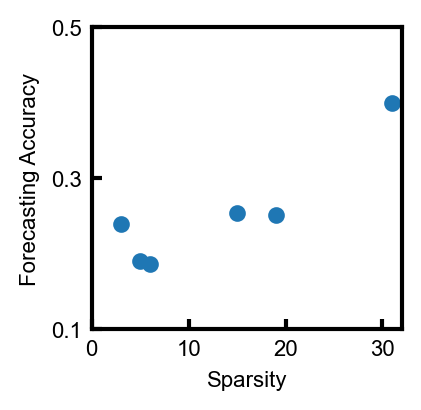

In [41]:
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 7
fig, ax = plt.subplots(1, 1, figsize=(2, 2))

ax.errorbar(
    df['90 percent'],
    df['DL Accuracy'],
    #yerr=df['DL Errorbar'],
    linestyle='',
    marker='o',
    markersize=5,
    capsize=3
)

ax.set_xlabel('Sparsity')
ax.set_ylabel('Forecasting Accuracy')
ax.set(xlim=[0, 32], ylim=[0.1, .5], yticks=[0.1, 0.3, 0.5])

plt.savefig('Figures/sparsity_dl_accuracy.svg', bbox_inches='tight')

# Figure 3 - Sparse continuum dynamics library

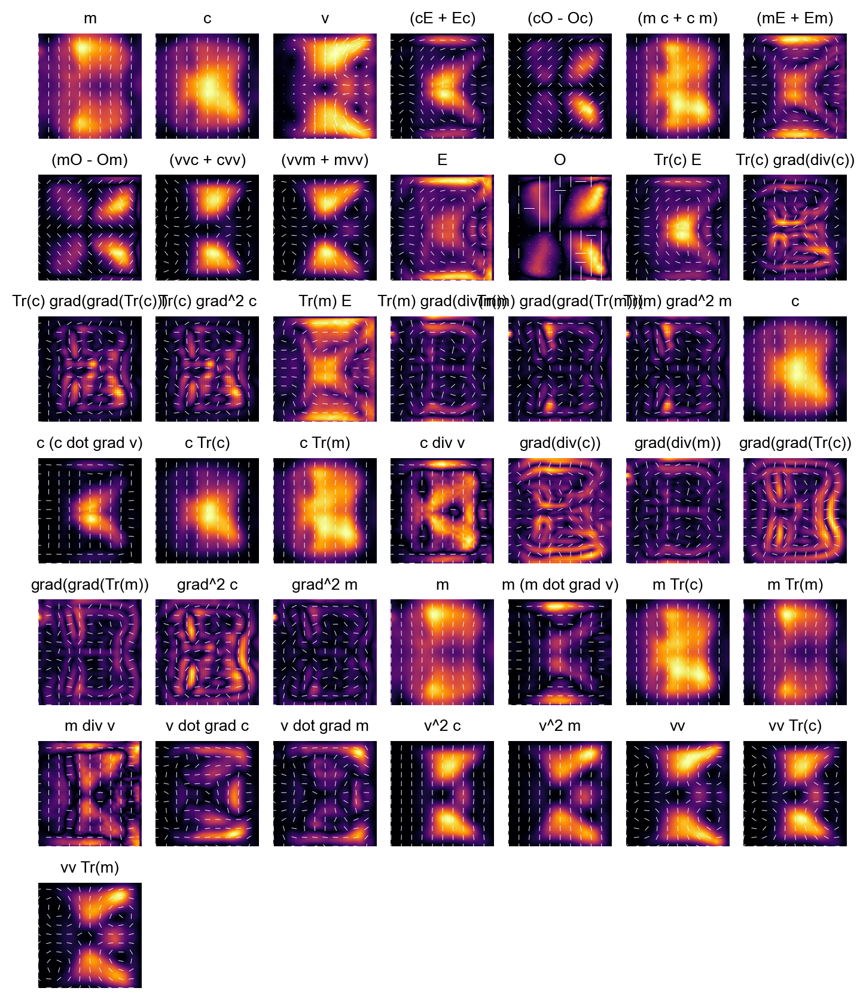

In [13]:
plt.rcParams['font.size'] = 8
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.frameon'] = False
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['xtick.major.width'] = 1.5
plt.rcParams['ytick.major.width'] = 1.5
plt.rcParams['legend.framealpha'] = 0.
plt.rcParams['legend.handlelength'] = 1.
plt.rcParams['legend.fontsize'] = 5
plt.rcParams['axes.linewidth'] = 0

with h5py.File('tensor_dynamics_fitting.h5', 'r') as h5f:
    lib = h5f['ensemble']
    
    tt = 30
    skip = 20
    ti = np.argmin(np.abs(lib['t'][()] - tt))
    keys = list(lib['X_raw'].keys())
    n_plots = 3 + len(keys)

    n_cols = 7
    n_rows = ceil(n_plots / n_cols)
    fig, ax = plt.subplots(n_rows, n_cols, 
                       figsize=(n_cols, n_rows*1.2),
                       sharey=True, sharex=True, dpi=200)

    ax = ax.flatten()
    ax[0].set_title('m')
    plot_tensor2D(ax[0], lib['fields/m'][ti][()], skip=skip)
    ax[1].set_title('c')
    plot_tensor2D(ax[1], lib['fields/c'][ti][()], skip=skip)
    ax[2].set_title('v')
    plot_vector2D(ax[2], lib['fields/v'][ti][()], skip=skip)
    
    for i, key in enumerate(keys):
        plot_tensor2D(ax[i+3], lib['X_raw'][key][ti][()], both=False, skip=skip)
        ax[i+3].set_title(key)
    
    for a in ax.flatten():
        a.set_aspect('auto') 
    
    plt.tight_layout()
    
    plt.savefig('Figures/continuum_dynamics_library.svg', bbox_inches='tight')
        

# Extra plots

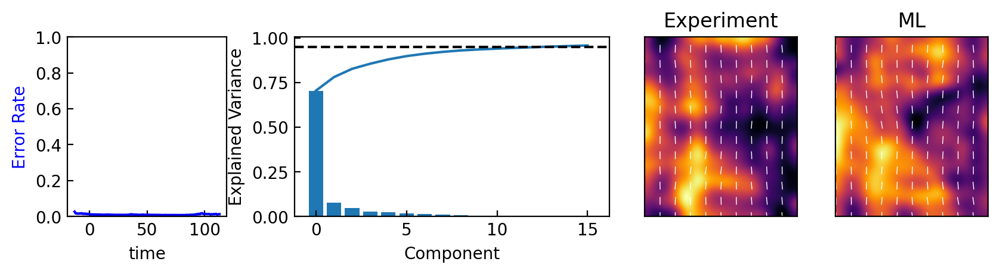

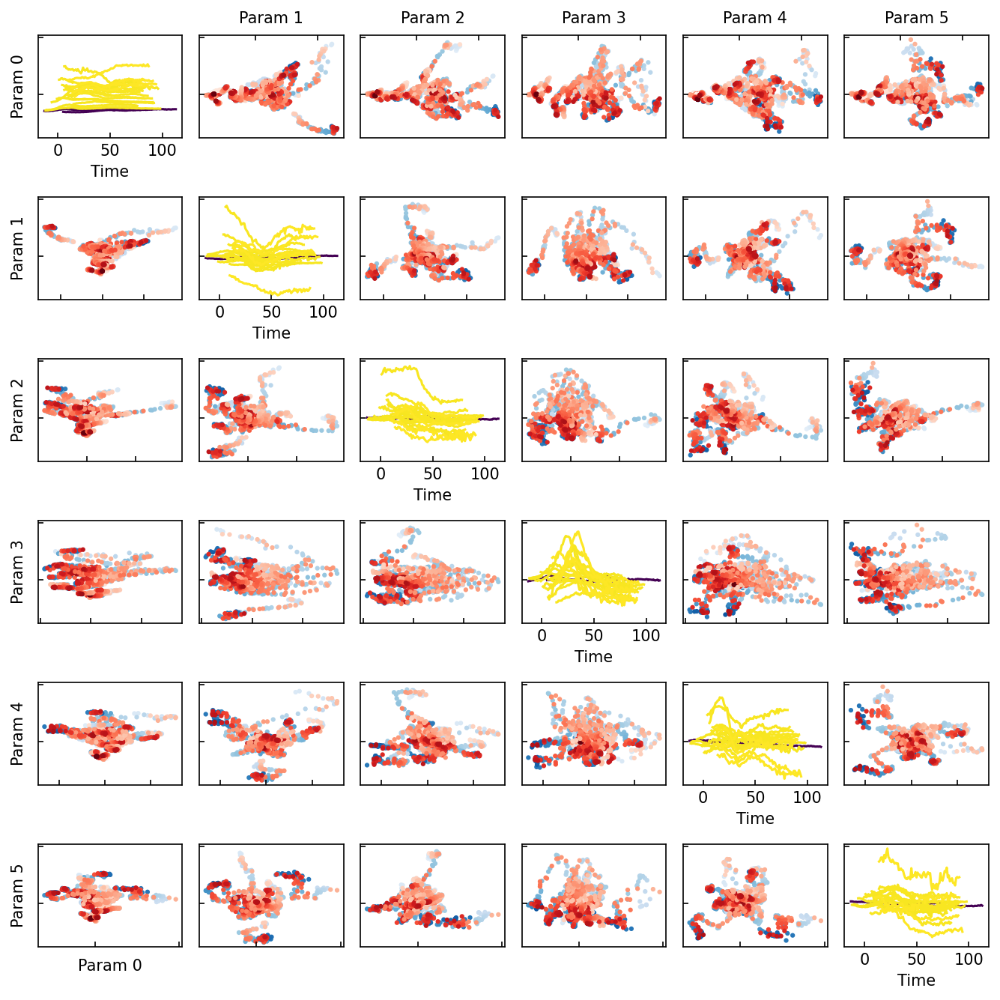

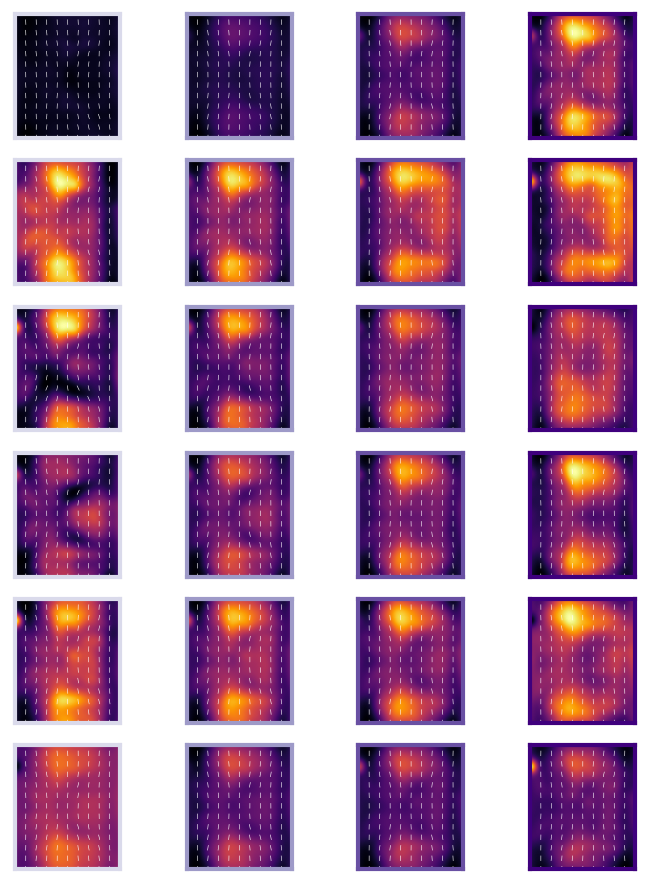

In [ ]:
pca_summary_plot(*sqh_info, sqh_dataset, 5, show_magnitude=False, cutoff=0.95, plot_fn=plot_tensor2D)
pca_point_plot(*sqh_info, cutoff=0.9)
pca_sweep_plot(*sqh_info, cutoff=0.9, plot_fn=plot_tensor2D)

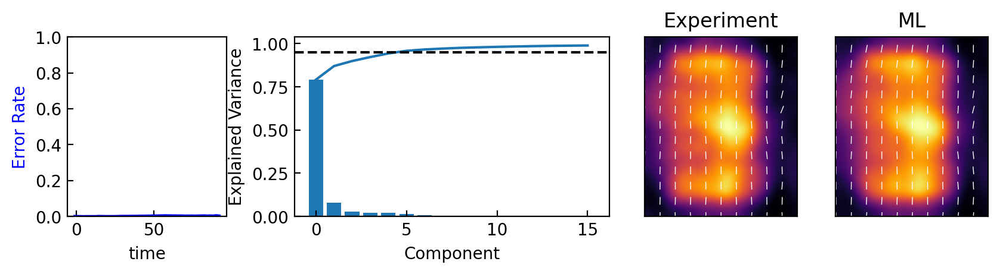

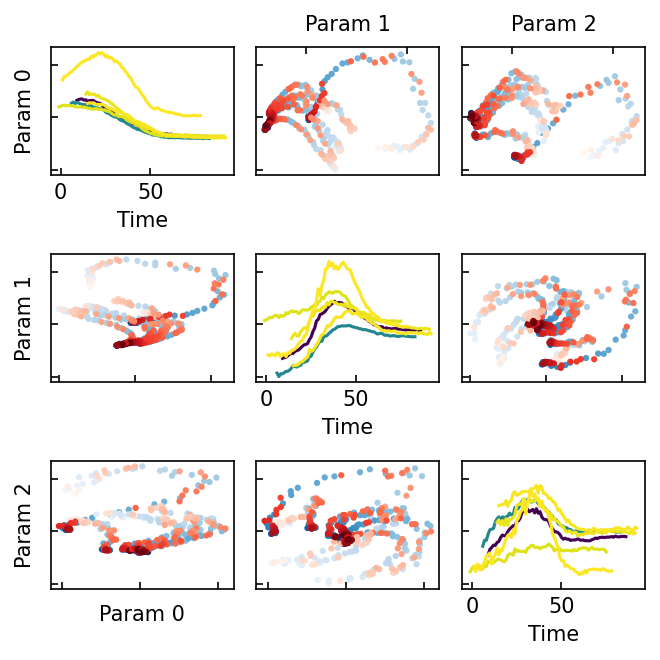

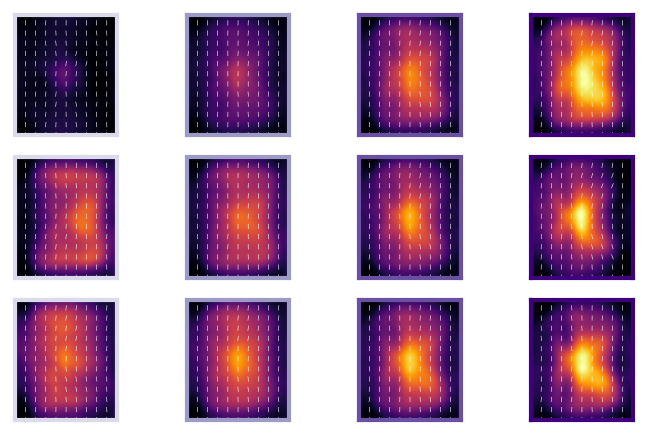

In [10]:
pca_summary_plot(*cad_info, cad_dataset, 5, show_magnitude=False, cutoff=0.95, plot_fn=plot_tensor2D)
pca_point_plot(*cad_info, cutoff=0.9)
pca_sweep_plot(*cad_info, cutoff=0.9, plot_fn=plot_tensor2D)

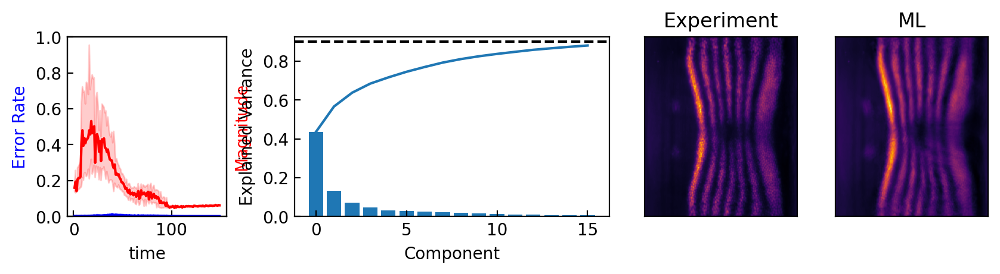

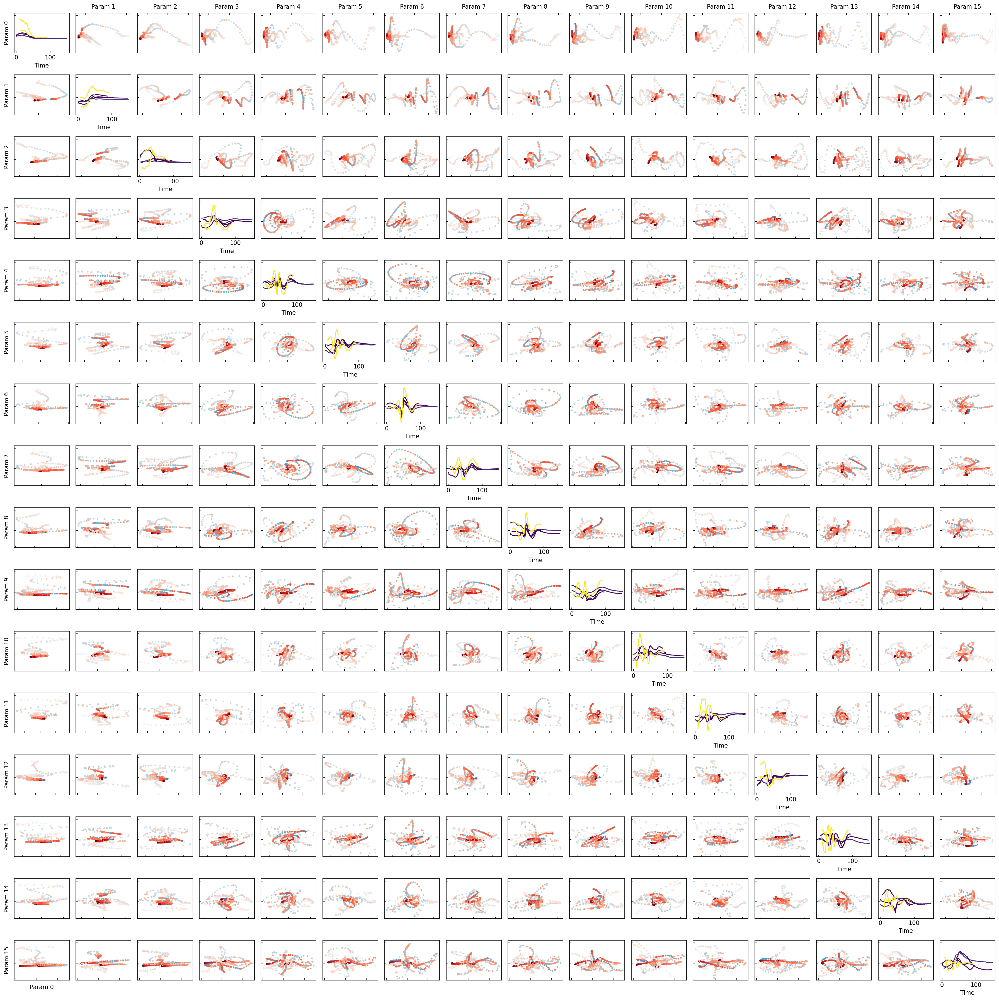

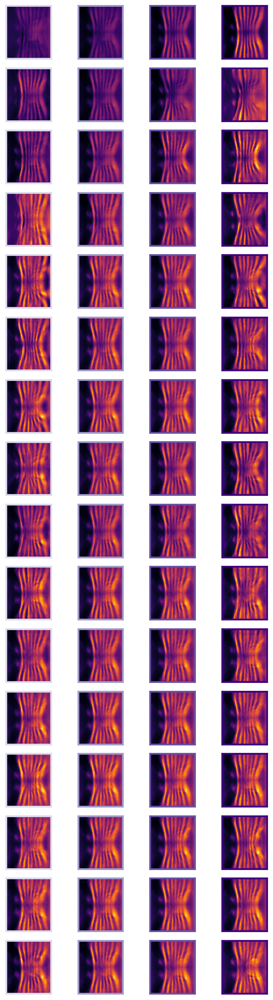

In [12]:
pca_summary_plot(*runt_info, runt_dataset, 5, show_magnitude=True, cutoff=0.9, plot_fn=color_2D)
pca_point_plot(*runt_info, cutoff=0.9)
pca_sweep_plot(*runt_info, cutoff=0.9, plot_fn=color_2D)

In [13]:
runt_info[0]

PCA(n_components=16, whiten=True)